Opened data/benchmark_velocity_train/clips/1


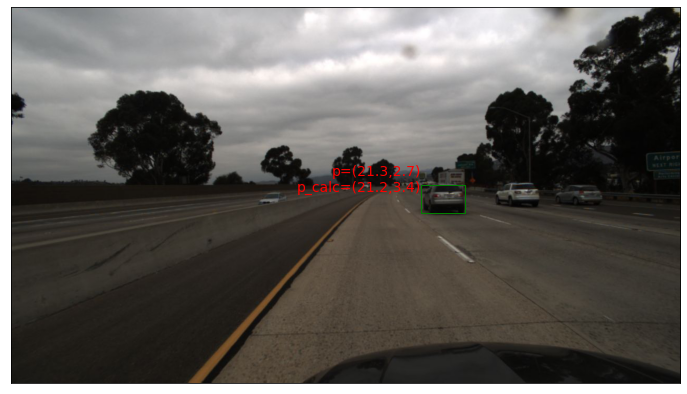

Opened data/benchmark_velocity_train/clips/2


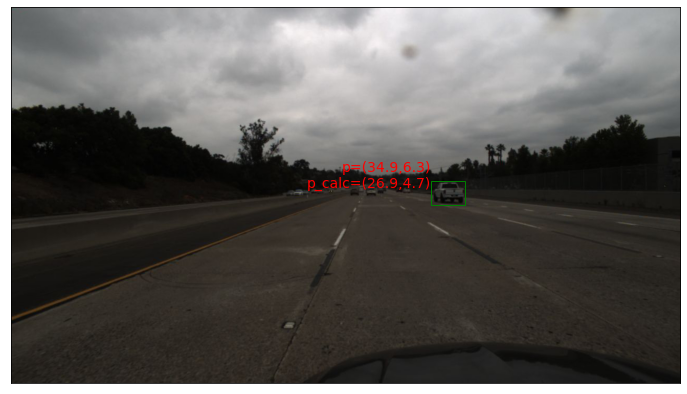

Opened data/benchmark_velocity_train/clips/3


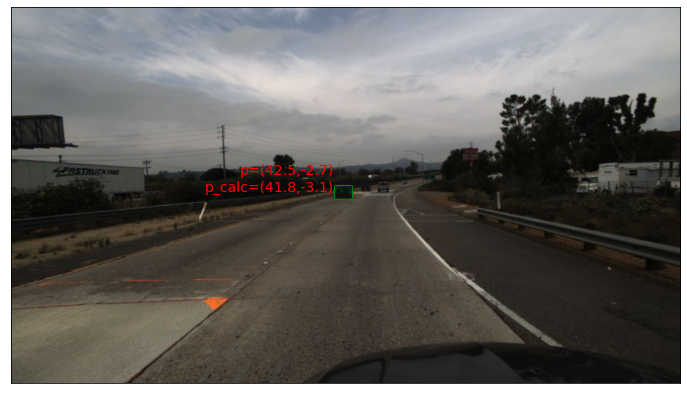

Opened data/benchmark_velocity_train/clips/4


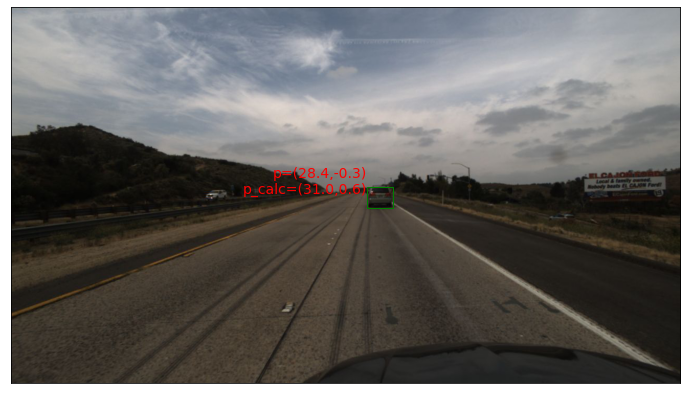

Opened data/benchmark_velocity_train/clips/5


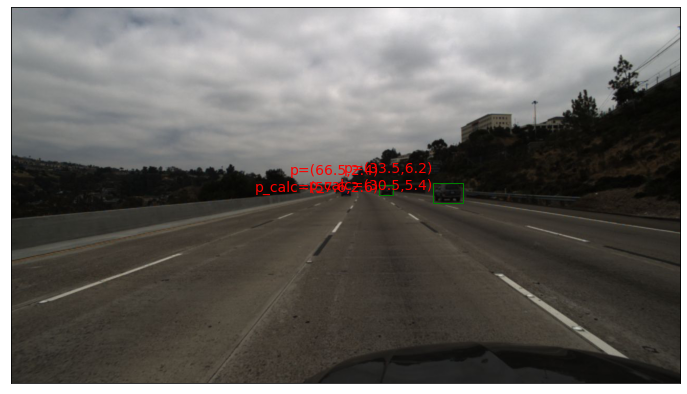

Opened data/benchmark_velocity_train/clips/6


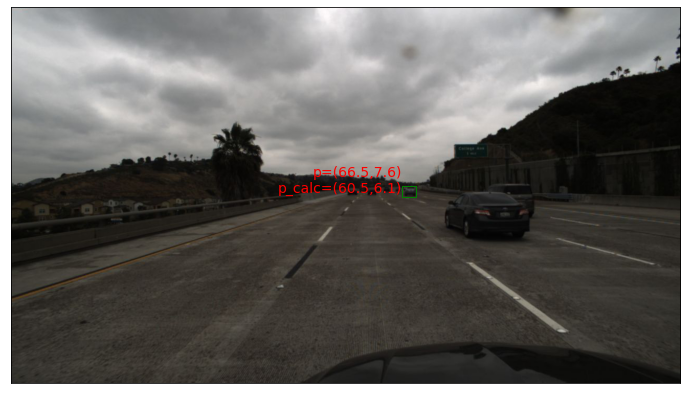

Opened data/benchmark_velocity_train/clips/7


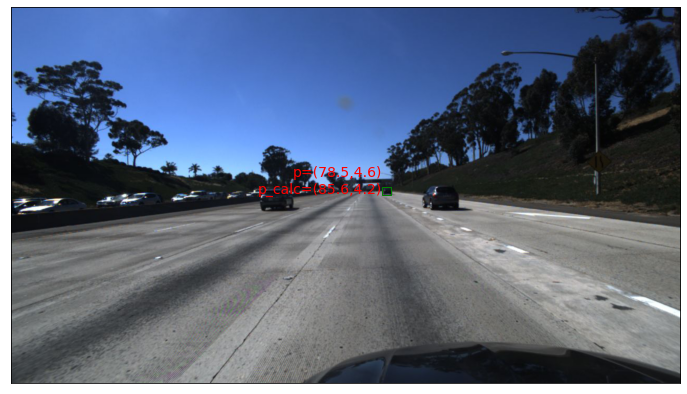

Opened data/benchmark_velocity_train/clips/8


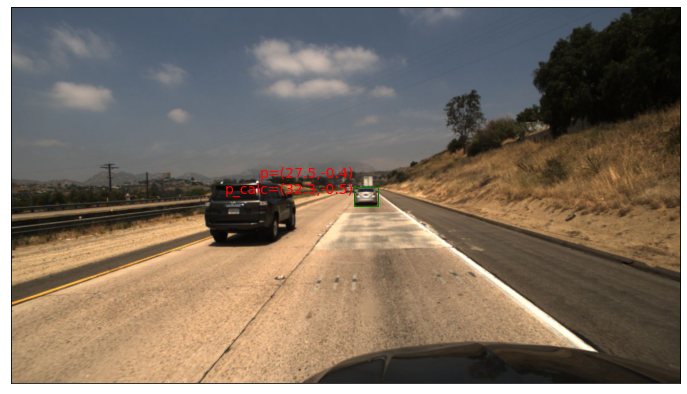

Opened data/benchmark_velocity_train/clips/9


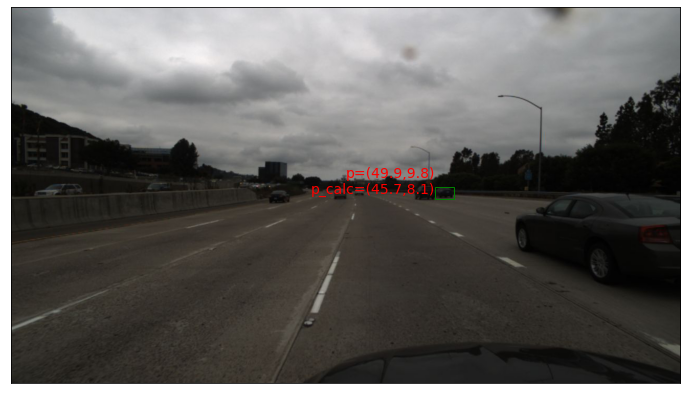

Opened data/benchmark_velocity_train/clips/10


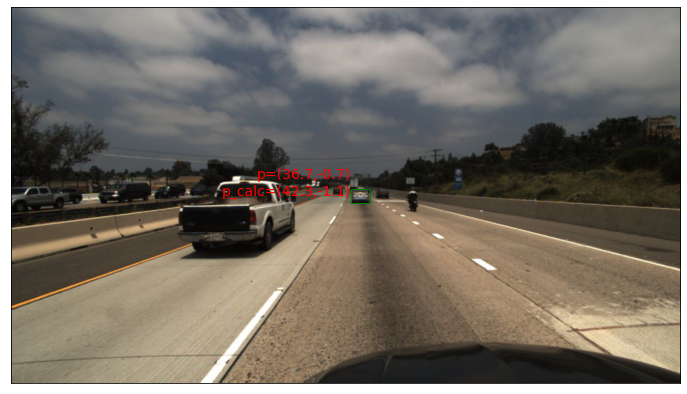

Opened data/benchmark_velocity_train/clips/11


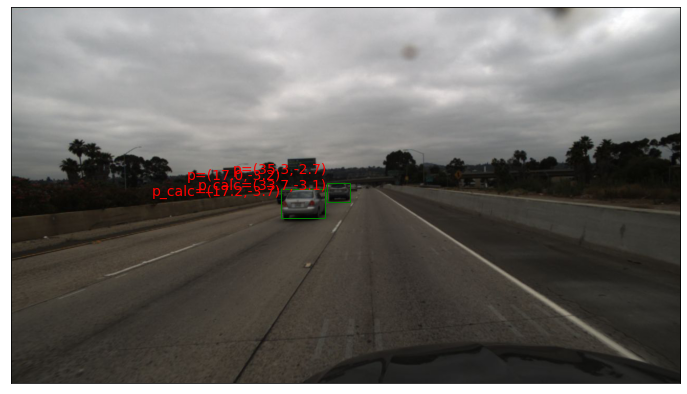

Opened data/benchmark_velocity_train/clips/12


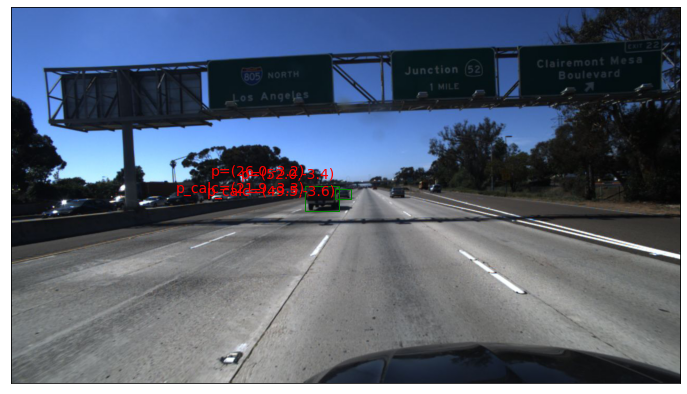

Opened data/benchmark_velocity_train/clips/13


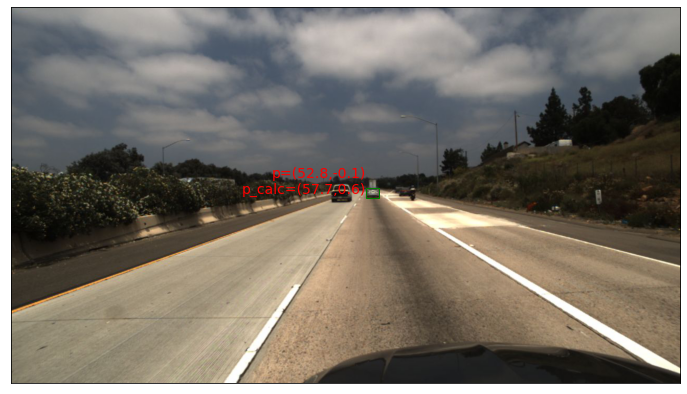

Opened data/benchmark_velocity_train/clips/14


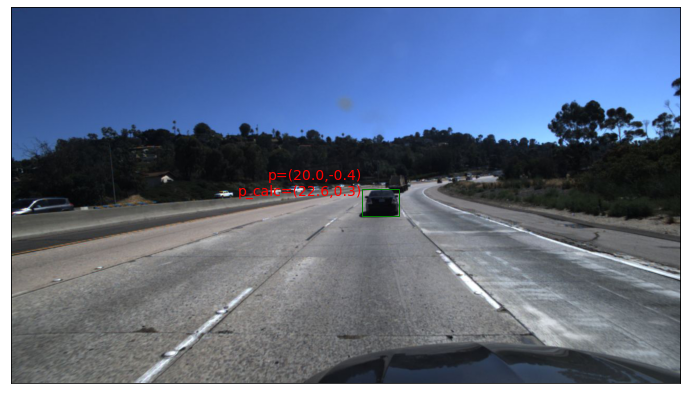

Opened data/benchmark_velocity_train/clips/15


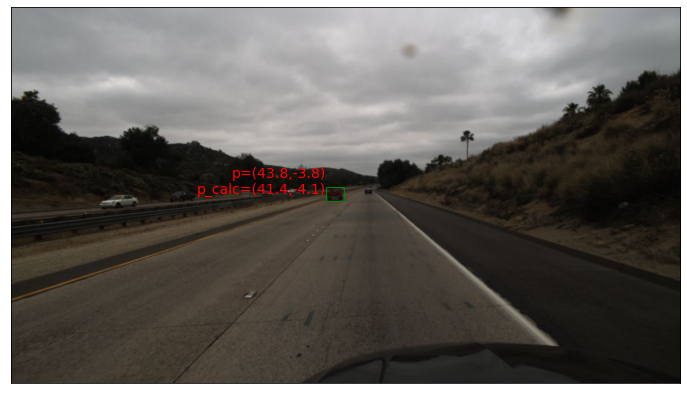

Opened data/benchmark_velocity_train/clips/16


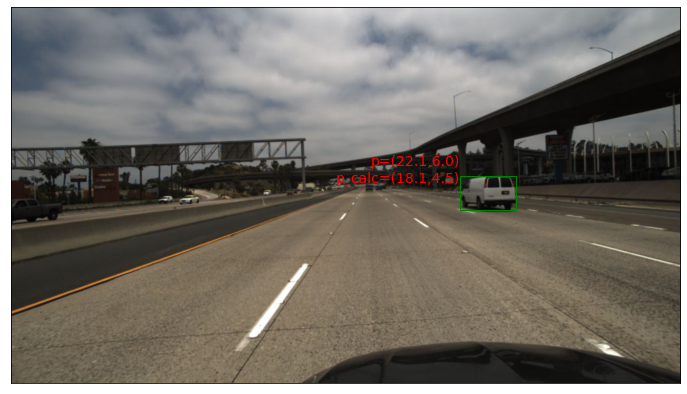

Opened data/benchmark_velocity_train/clips/17


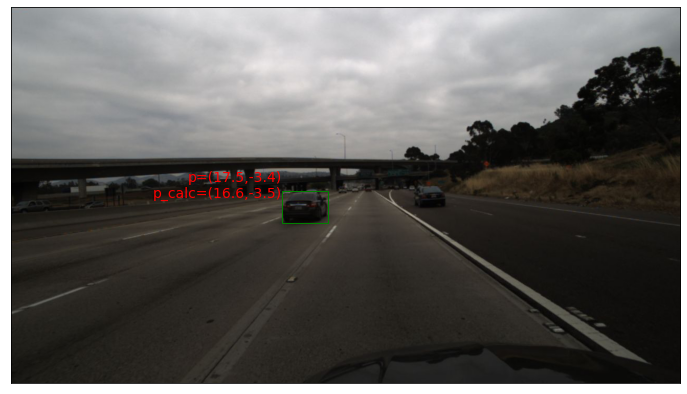

Opened data/benchmark_velocity_train/clips/18


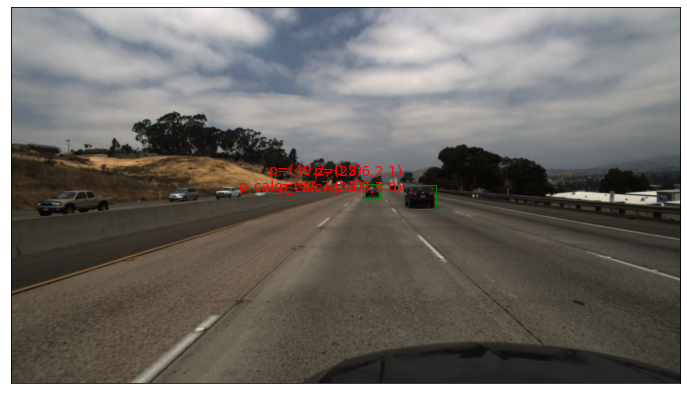

Opened data/benchmark_velocity_train/clips/19


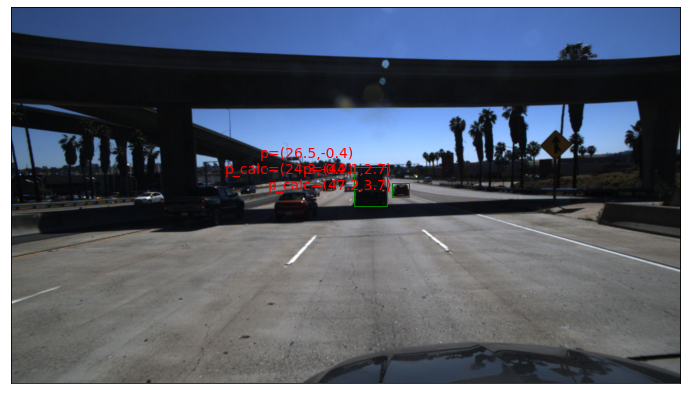

Opened data/benchmark_velocity_train/clips/20


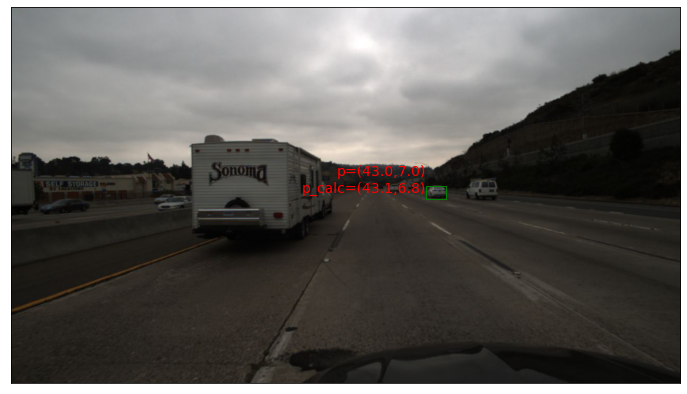

Opened data/benchmark_velocity_train/clips/21


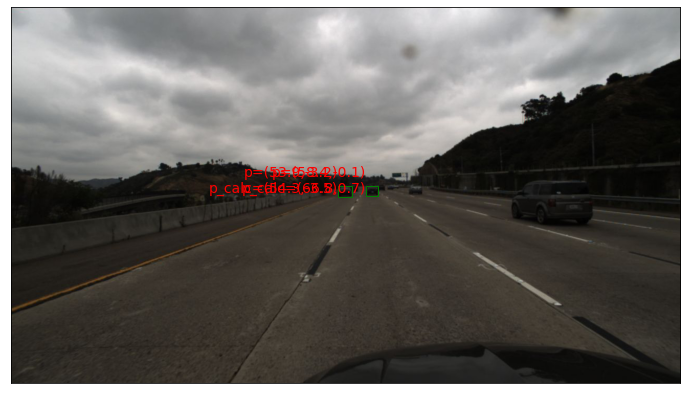

Opened data/benchmark_velocity_train/clips/22


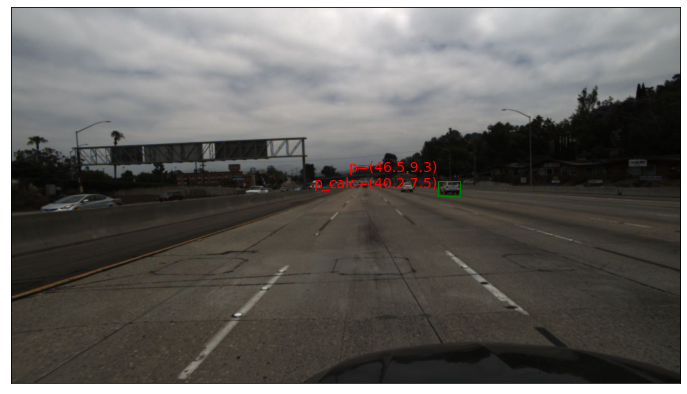

Opened data/benchmark_velocity_train/clips/23


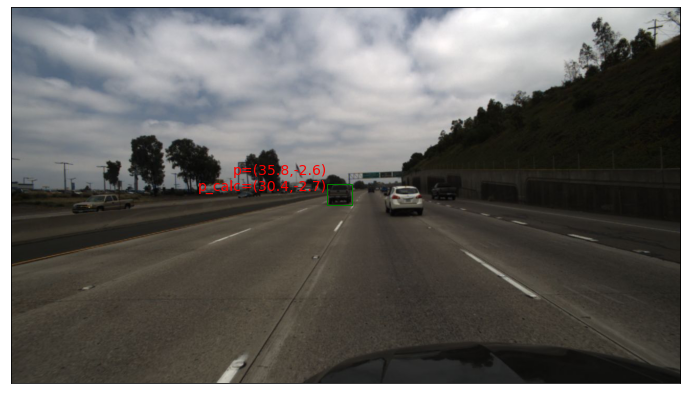

Opened data/benchmark_velocity_train/clips/24


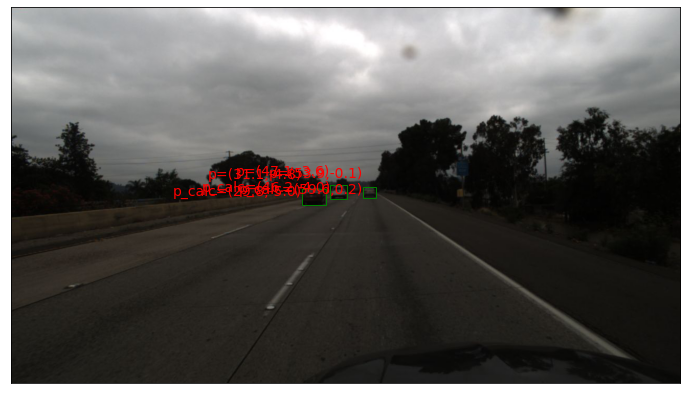

Opened data/benchmark_velocity_train/clips/25


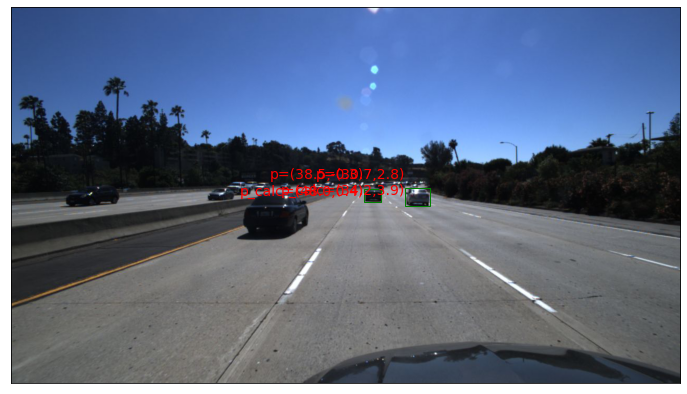

Opened data/benchmark_velocity_train/clips/26


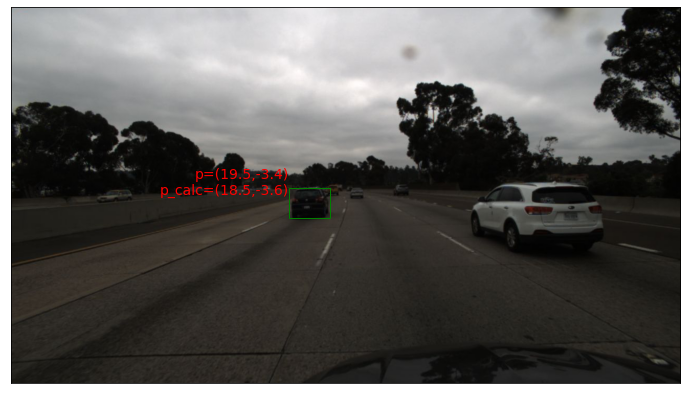

Opened data/benchmark_velocity_train/clips/27


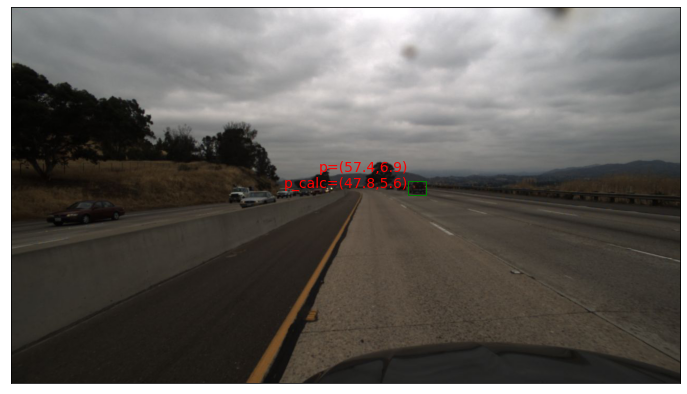

Opened data/benchmark_velocity_train/clips/28


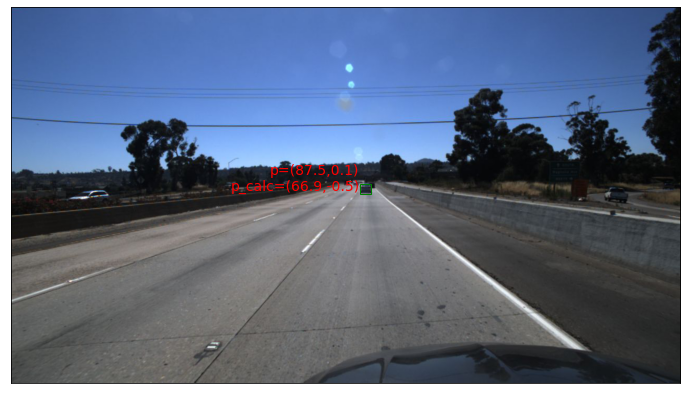

Opened data/benchmark_velocity_train/clips/29


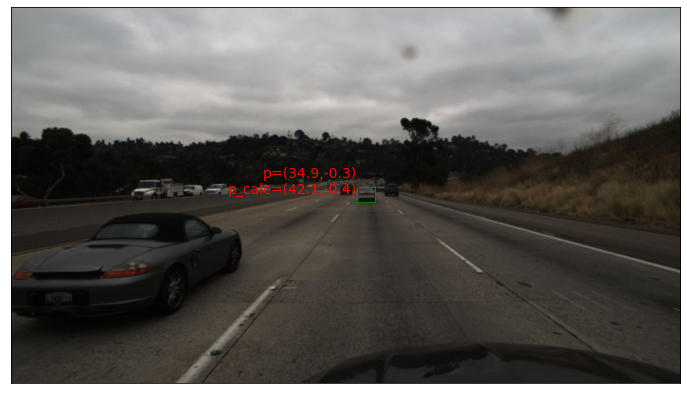

Opened data/benchmark_velocity_train/clips/30


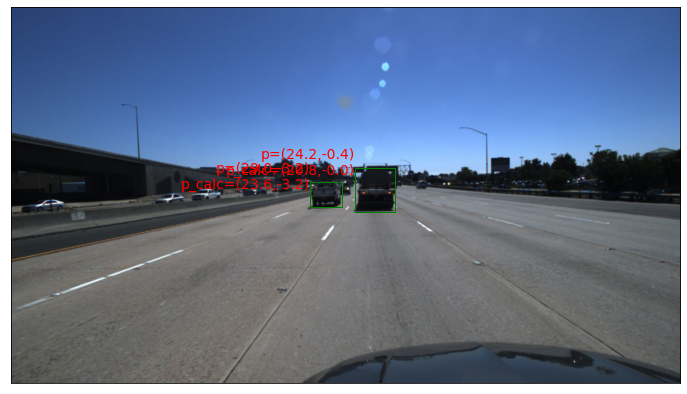

Opened data/benchmark_velocity_train/clips/31


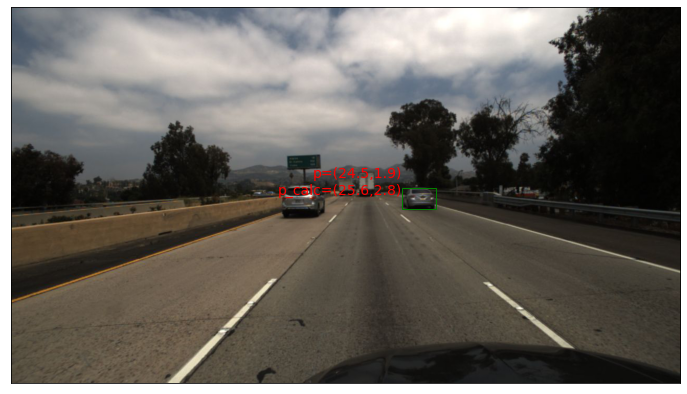

Opened data/benchmark_velocity_train/clips/32


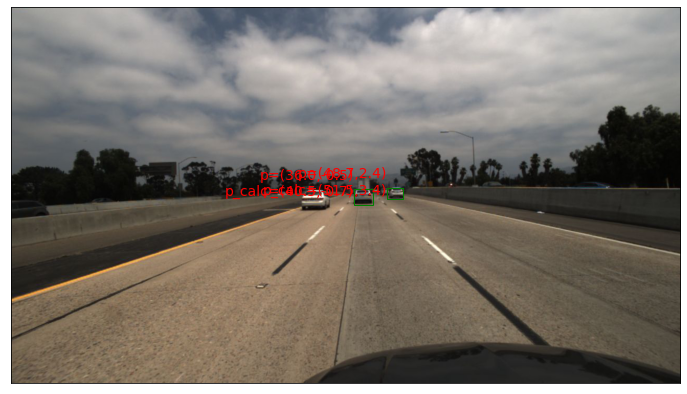

Opened data/benchmark_velocity_train/clips/33


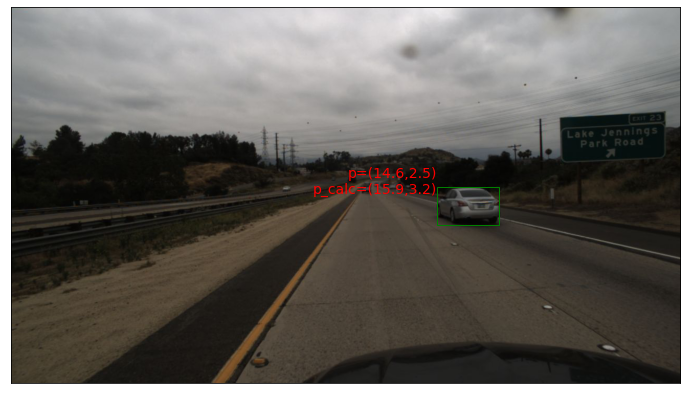

Opened data/benchmark_velocity_train/clips/34


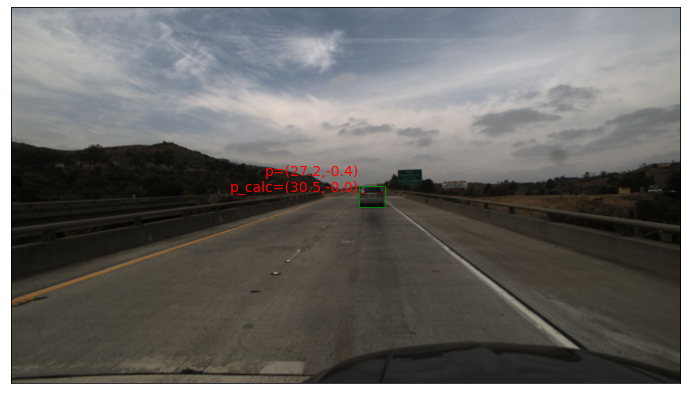

Opened data/benchmark_velocity_train/clips/35


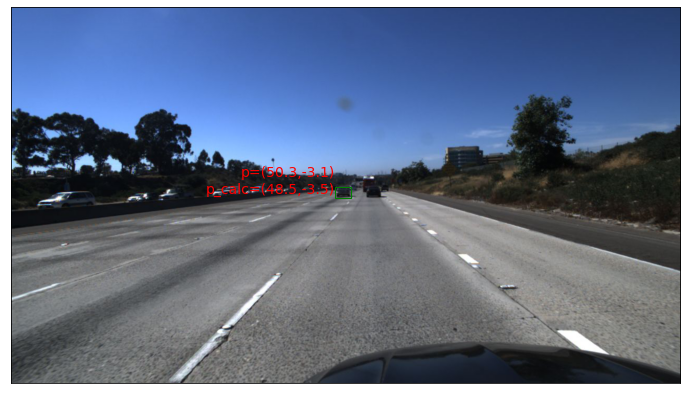

Opened data/benchmark_velocity_train/clips/36


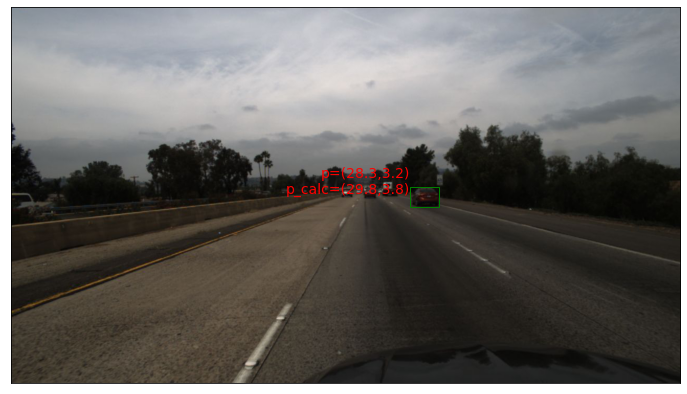

Opened data/benchmark_velocity_train/clips/37


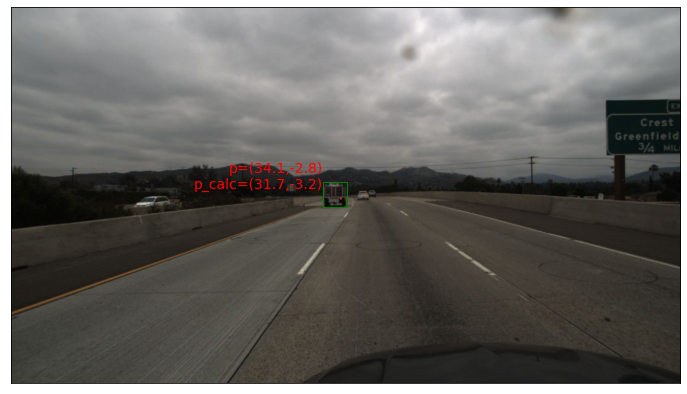

Opened data/benchmark_velocity_train/clips/38


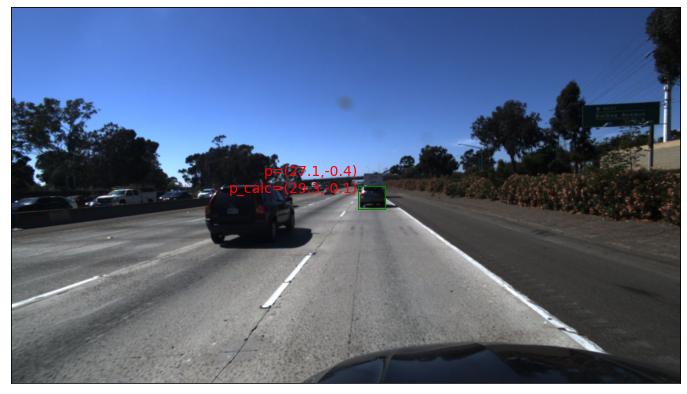

Opened data/benchmark_velocity_train/clips/39


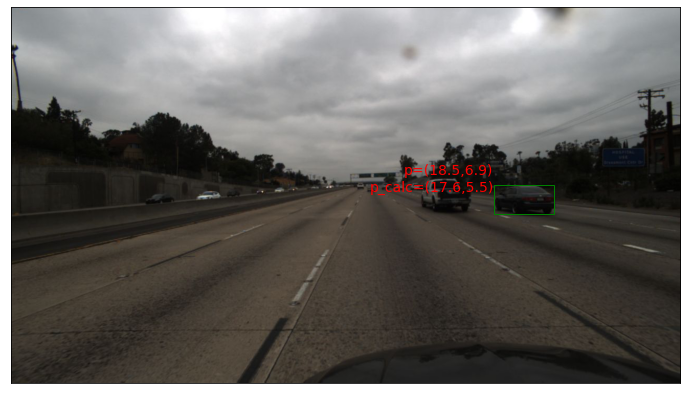

Opened data/benchmark_velocity_train/clips/40


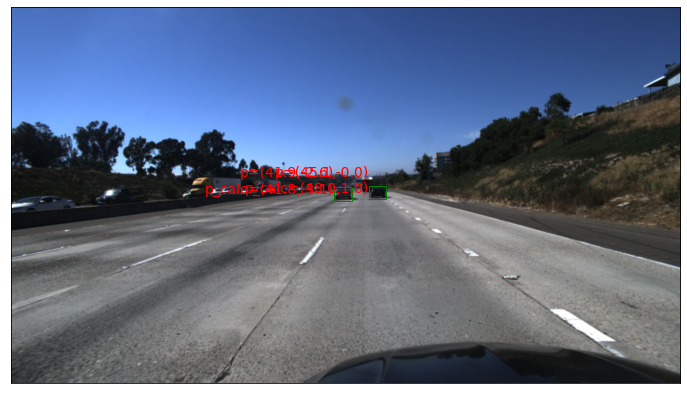

Opened data/benchmark_velocity_train/clips/41


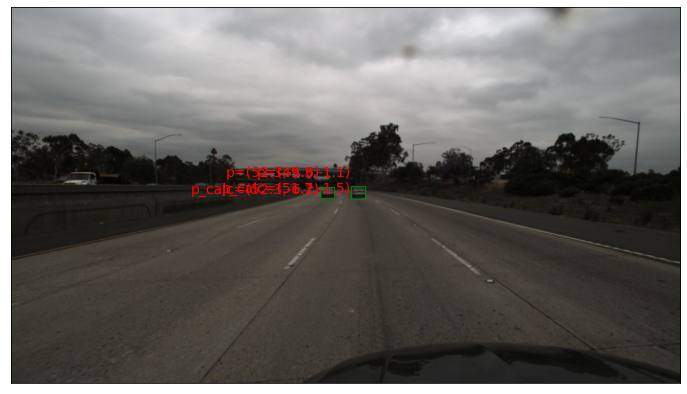

Opened data/benchmark_velocity_train/clips/42


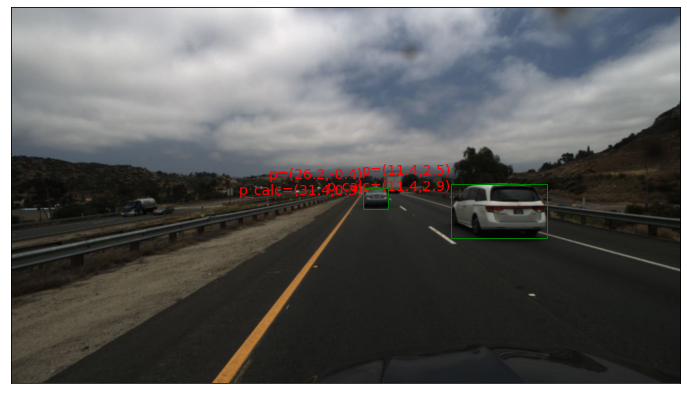

Opened data/benchmark_velocity_train/clips/43


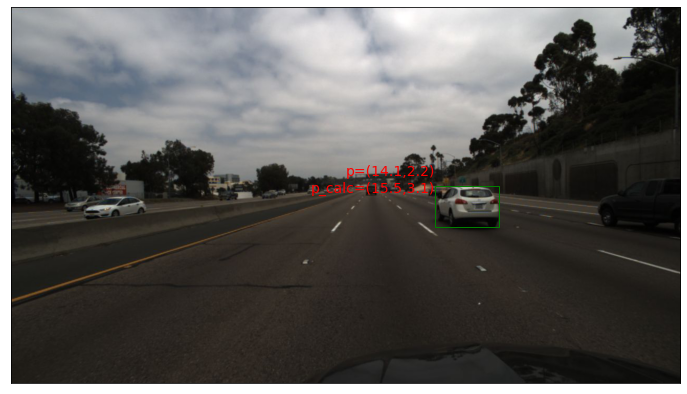

Opened data/benchmark_velocity_train/clips/44


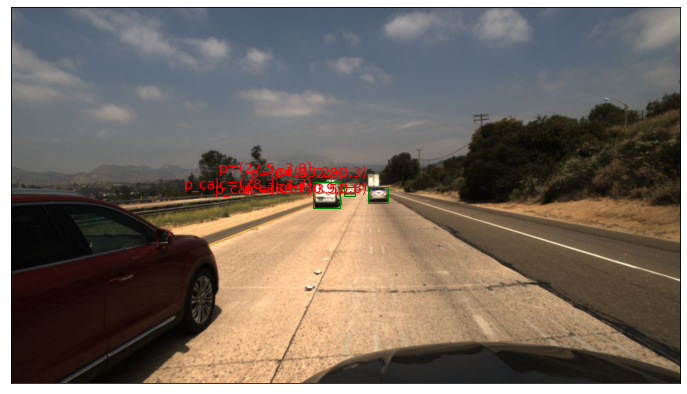

Opened data/benchmark_velocity_train/clips/45


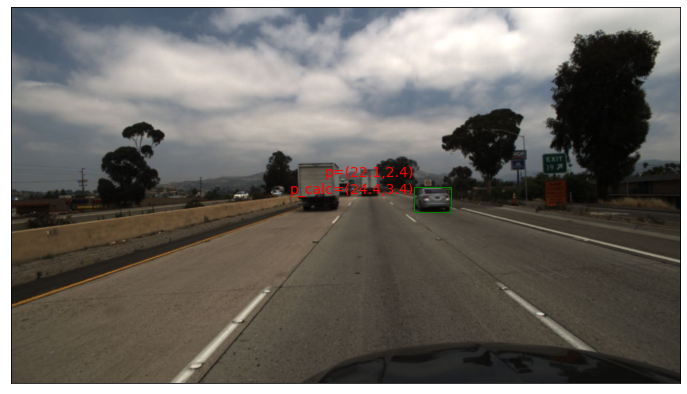

Opened data/benchmark_velocity_train/clips/46


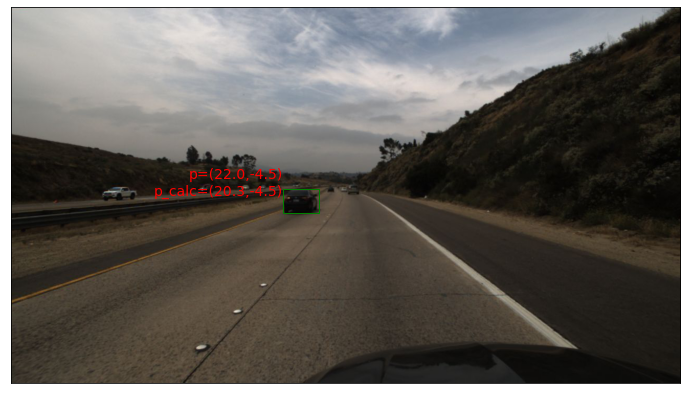

Opened data/benchmark_velocity_train/clips/47


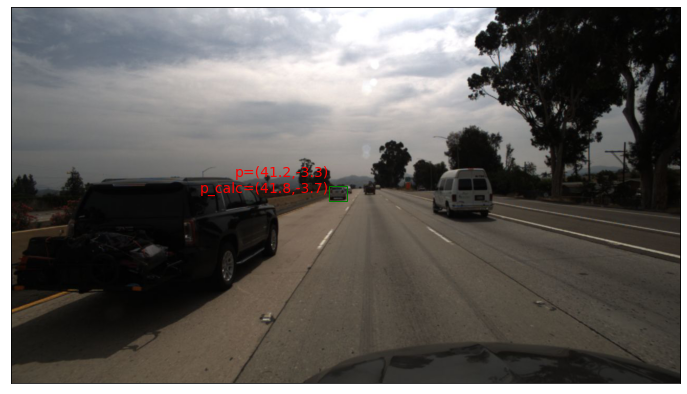

Opened data/benchmark_velocity_train/clips/48


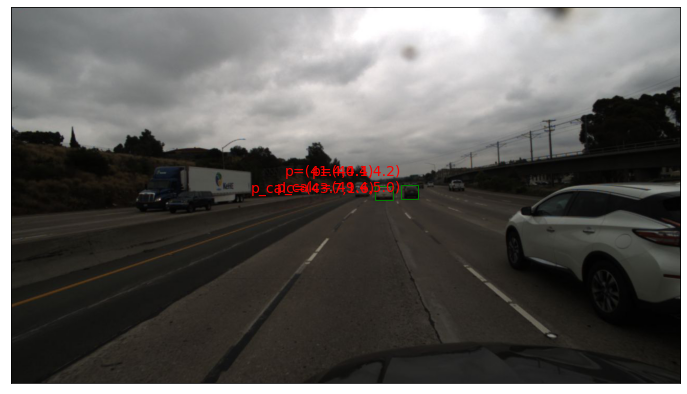

Opened data/benchmark_velocity_train/clips/49


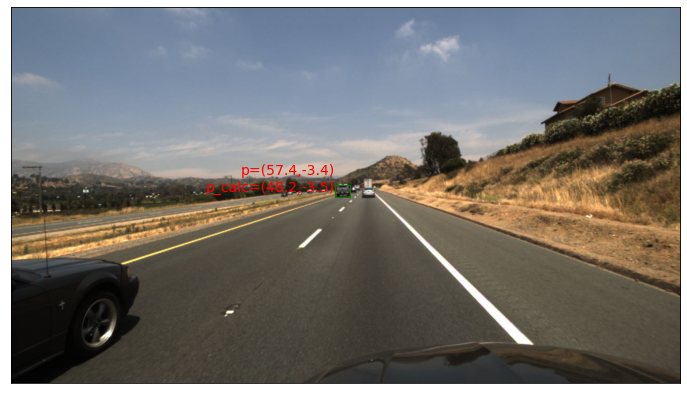

Opened data/benchmark_velocity_train/clips/50


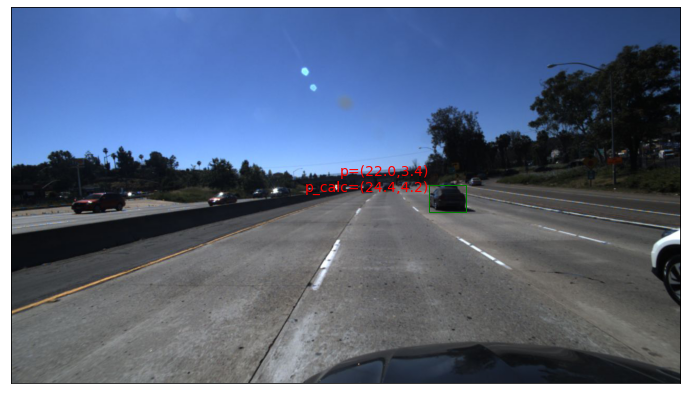

67


[(119.02543333333332, -9.308226666666654),
 (102.0218, -10.692811428571433),
 (75.17421111313243, -15.826419625834577),
 (42.00897647058824, -13.932371764705882),
 (79.35028888888888, -2.9832977777777936),
 (29.149047642060253, -15.402001107590406),
 (25.50545, -6.351785714285715)]

In [84]:
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
import json
import os
import csv
# from positionalVisualisation.positionalVisualiser.py import makeVisualisation



def get_xz_from_uv(bbox):
    # ref : http://ksimek.github.io/2013/08/13/intrinsic/
    car_width = 2.0  # assume car width is always 2.0m...
    fx = 714.1526
    fy = 710.3725
    cx = 713.85
    cy = 327

    # distance calc ref: http://emaraic.com/blog/distance-measurement
    d = fx * (car_width / (bbox['right'] - bbox['left']))

    # find the approximate centre of the car ref:
    bb_c = (bbox['right'] + bbox['left'])/2

    # calculate the approx world x location from the pixel u
    # ref slide 10 of: http://www.cse.psu.edu/~rtc12/CSE486/lecture12.pdf
    approx_x = (bb_c - cx )*d/fx

    # TODO: Add a dynamic correction factor based of the training data.
    return approx_x,d


test_clip = 50
debug = True



predicted_points = []
provided_points = []
results = []

for test_clip in range(1,test_clip+1):
    original = cv2.imread("data/benchmark_velocity_train/clips/" + str(test_clip) + "/imgs/040.jpg")
    
    if debug:
        img = original.copy()

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


        plt.figure(figsize=(12, 8))
        plt.imshow(img)
        # Get the current reference
        ax = plt.gca()

    # Find bounding boxes and plot them
    with open("data/benchmark_velocity_train/clips/" + str(test_clip) + "/annotation.json") as json_file:
        print("Opened "+"data/benchmark_velocity_train/clips/" + str(test_clip) )
        data = json.load(json_file)
        for car_an in data:
#             car_an['bbox']['left']+=4
#             car_an['bbox']['right']+=4 #for image 13 testing
            
            width = car_an['bbox']['right'] - car_an['bbox']['left']
            height = car_an['bbox']['top'] - car_an['bbox']['bottom']

            x, z = get_xz_from_uv(car_an['bbox'])
            
            x+=0.053439859801385325*z-0.5385462033846319 #testing least-square adjustment, y distance
            z+=0.6055511973113685*x + 2.2209803015779133 #testing least-square adjustment, x distance
            x+=0.0026834076878362386*(car_an['bbox']['right'] + car_an['bbox']['left'])/2 + -1.899805878278793

            predicted_points.append((z,x))
            provided_points.append((car_an['position'][0], car_an['position'][1]))
            currResult = {"imNumber": test_clip, "imShape":original.shape, "bbox":car_an['bbox'], "provided":(car_an['position'][0], car_an['position'][1]), "predicted":(z,x)}
            results.append(currResult)
            
            if debug:
                # Create a Rectangle patch
                text_annotated = "p=("+str("%.1f"%car_an['position'][0])+","+str("%.1f"%car_an['position'][1])+")"
                text_annotated2 = "p_calc=("+str("%.1f"%z)+","+str("%.1f"%x)+")"

                rect = Rectangle((car_an['bbox']['left'], car_an['bbox']['bottom']), width, height, linewidth=1, edgecolor='g', facecolor='none')
                ax.annotate(text_annotated+"\n"+text_annotated2, xy=(car_an['bbox']['left'], car_an['bbox']['top']), xycoords='data',
                            xytext=(car_an['bbox']['left'], car_an['bbox']['top']-40), textcoords='data',
                            horizontalalignment='right', verticalalignment='top',color='red',fontsize=14,rotation=0
                            )
                # Add the patch to the Axes
                ax.add_patch(rect)
    if debug:
        plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
        plt.show()


print(len(predicted_points))

# import csv
# with open('position_data.csv', 'w', newline='') as file:
#     writer = csv.writer(file)
#     writer.writerow(["sample_x", "predict_x","abs_error_x","percent_error_x","sample_y","predict_y","abs_error_y","percent_error_y"])
#     for i in range(len(predicted_points)):
#         print("writing sample "+str(i))
#         abs_err_x = abs(provided_points[i][0]- predicted_points[i][0])
#         abs_err_y = abs(provided_points[i][1] - predicted_points[i][1])

#         per_err_x = abs(100*abs_err_x/provided_points[i][0])
#         per_err_y =  abs(100*abs_err_y/provided_points[i][1])

#         writer.writerow([provided_points[i][0], predicted_points[i][0],abs_err_x,per_err_x,provided_points[i][1], predicted_points[i][1],abs_err_y,per_err_y])


eep = []
x = [
        {
            "left": 652.0006400000001,
            "top": 345.999924,
            "right": 664.0006400000001,
            "bottom": 353.99991600000004
        },
        {
            "left": 632.00032,
            "top": 345.999996,
            "right": 646.00032,
            "bottom": 356.000004
        },
        {
            "left": 553.9995520000001,
            "top": 345.99967200000003,
            "right": 572.999488,
            "bottom": 356.999688
        },
        {
            "left": 459.99968,
            "top": 349.999848,
            "right": 493.99968,
            "bottom": 365.999832
        },
        {
            "left": 678.0003199999999,
            "top": 343.000008,
            "right": 696.0003199999999,
            "bottom": 358.999992
        },
        {
            "left": 312.000448,
            "top": 355.99975200000006,
            "right": 361.00051199999996,
            "bottom": 375.999768
        },
        {
            "left": 508,
            "top": 345.999672,
            "right": 564,
            "bottom": 383.99968799999994
        }
    ]

for i in x:
    x, z = get_xz_from_uv(i)
    eep.append((z,x))
eep

Average PercErrX 9.256893764471757
Max errX 20.587333126392366
Average PercErrY 111.32866669507777
Max errY 1.8431689684572445


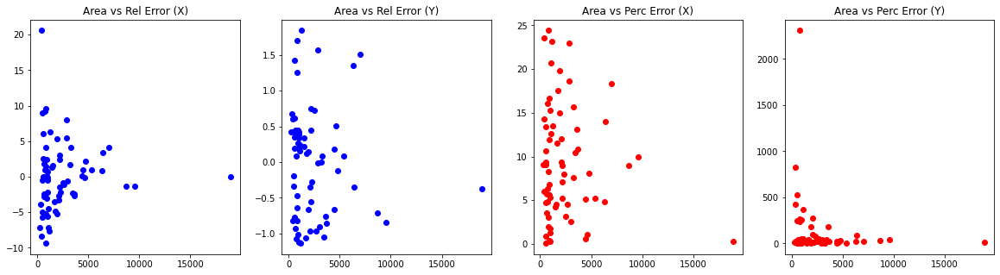

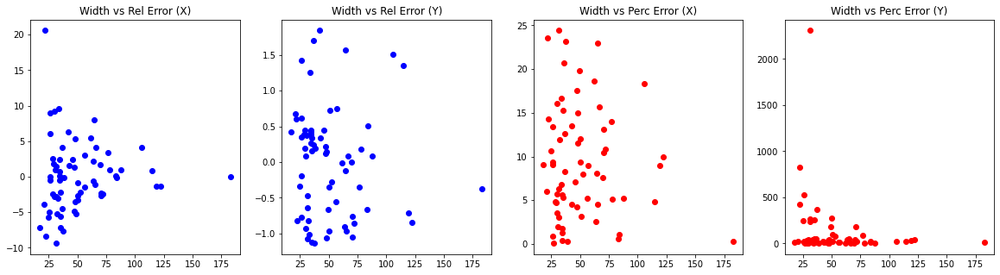

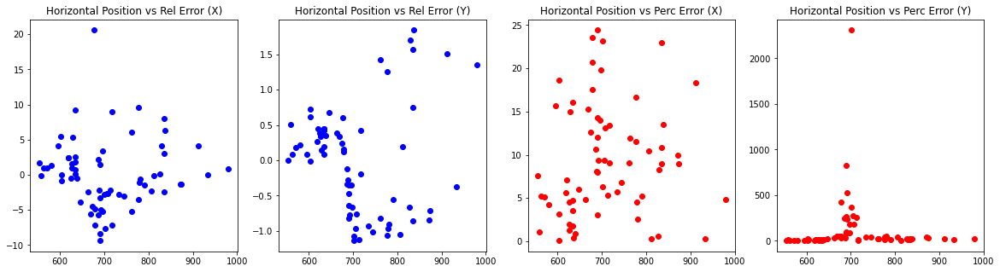

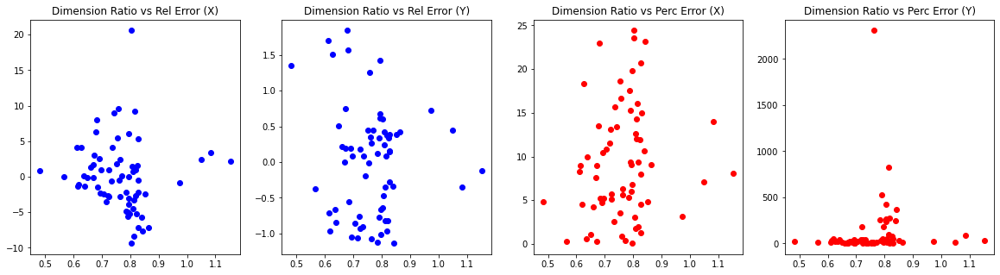

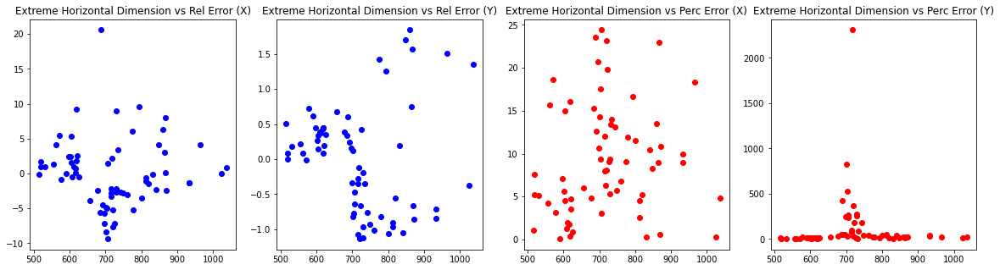

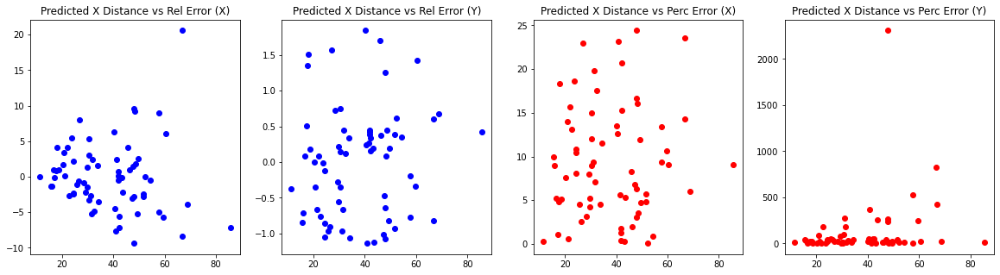

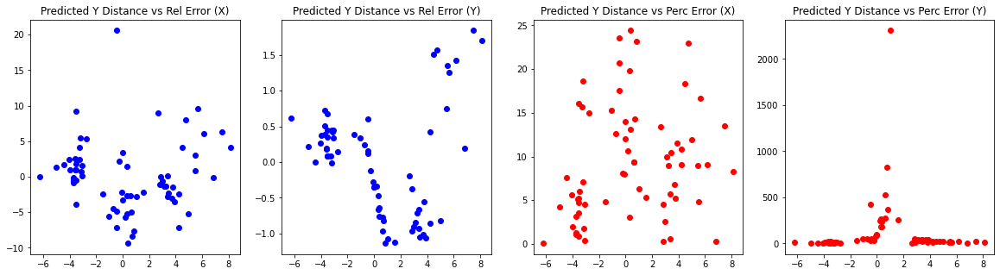

In [85]:
areaList = []
avgImX = []
dimRatio = []
extremeDim = [] # gets the most left/right dimension
widthList = []

xDistanceList = []
yDistanceList = []

absErX = []
absErY = []

percErrX = []
percErrY = []


for vehicle in results:
#     vehicle bbox params
    width = vehicle['bbox']['right'] - vehicle['bbox']['left']
    height = vehicle['bbox']['top'] - vehicle['bbox']['bottom']
    area = abs(width*height)
    ratio = abs(height/width)
    averageImX = (vehicle['bbox']['right'] + vehicle['bbox']['left'])/2
    if vehicle['bbox']['left'] < vehicle["imShape"][1]-vehicle['bbox']['right']:
        mostExtremeDimension = vehicle['bbox']['left']
    else:
        mostExtremeDimension = vehicle['bbox']['right']
    
    abs_err_x = (vehicle["provided"][0]- vehicle["predicted"][0])
    abs_err_y = (vehicle["provided"][1] - vehicle["predicted"][1])
    per_err_x = abs(100*abs_err_x/vehicle["provided"][0])
    per_err_y =  abs(100*abs_err_y/vehicle["provided"][1])
    
    xDistanceList.append(vehicle["predicted"][0])
    yDistanceList.append(vehicle["predicted"][1])
    
    areaList.append(area)
    avgImX.append(averageImX)
    dimRatio.append(ratio)
    extremeDim.append(mostExtremeDimension)
    widthList.append(width)

    absErX.append(abs_err_x)
    absErY.append(abs_err_y)
    percErrX.append(per_err_x)
    percErrY.append(per_err_y)

print(f"Average PercErrX {np.mean(percErrX)}")
print(f"Max errX {np.max(np.abs(absErX))}")

print(f"Average PercErrY {np.mean(percErrY)}")
print(f"Max errY {np.max(np.abs(absErY))}")

    
plt.figure(figsize=(20, 5))
plt.subplot(141),plt.scatter(areaList, absErX, c='b'),plt.title('Area vs Rel Error (X)')
plt.subplot(142),plt.scatter(areaList, absErY, c='b'),plt.title("Area vs Rel Error (Y)")
plt.subplot(143),plt.scatter(areaList, percErrX, c='r'),plt.title('Area vs Perc Error (X)')
plt.subplot(144),plt.scatter(areaList, percErrY, c='r'),plt.title("Area vs Perc Error (Y)")
plt.show()

plt.figure(figsize=(20, 5))
plt.subplot(141),plt.scatter(widthList, absErX, c='b'),plt.title('Width vs Rel Error (X)')
plt.subplot(142),plt.scatter(widthList, absErY, c='b'),plt.title("Width vs Rel Error (Y)")
plt.subplot(143),plt.scatter(widthList, percErrX, c='r'),plt.title('Width vs Perc Error (X)')
plt.subplot(144),plt.scatter(widthList, percErrY, c='r'),plt.title("Width vs Perc Error (Y)")
plt.show()

plt.figure(figsize=(20, 5))
plt.subplot(141),plt.scatter(avgImX, absErX, c='b'),plt.title('Horizontal Position vs Rel Error (X)')
plt.subplot(142),plt.scatter(avgImX, absErY, c='b'),plt.title("Horizontal Position vs Rel Error (Y)")
plt.subplot(143),plt.scatter(avgImX, percErrX, c='r'),plt.title('Horizontal Position vs Perc Error (X)')
plt.subplot(144),plt.scatter(avgImX, percErrY, c='r'),plt.title("Horizontal Position vs Perc Error (Y)")
plt.show()

plt.figure(figsize=(20, 5))
plt.subplot(141),plt.scatter(dimRatio, absErX, c='b'),plt.title('Dimension Ratio vs Rel Error (X)')
plt.subplot(142),plt.scatter(dimRatio, absErY, c='b'),plt.title("Dimension Ratio vs Rel Error (Y)")
plt.subplot(143),plt.scatter(dimRatio, percErrX, c='r'),plt.title('Dimension Ratio vs Perc Error (X)')
plt.subplot(144),plt.scatter(dimRatio, percErrY, c='r'),plt.title("Dimension Ratio vs Perc Error (Y)")
plt.show()

plt.figure(figsize=(20, 5))
plt.subplot(141),plt.scatter(extremeDim, absErX, c='b'),plt.title('Extreme Horizontal Dimension vs Rel Error (X)')
plt.subplot(142),plt.scatter(extremeDim, absErY, c='b'),plt.title("Extreme Horizontal Dimension vs Rel Error (Y)")
plt.subplot(143),plt.scatter(extremeDim, percErrX, c='r'),plt.title('Extreme Horizontal Dimension vs Perc Error (X)')
plt.subplot(144),plt.scatter(extremeDim, percErrY, c='r'),plt.title("Extreme Horizontal Dimension vs Perc Error (Y)")
plt.show()

plt.figure(figsize=(20, 5))
plt.subplot(141),plt.scatter(xDistanceList, absErX, c='b'),plt.title('Predicted X Distance vs Rel Error (X)')
plt.subplot(142),plt.scatter(xDistanceList, absErY, c='b'),plt.title("Predicted X Distance vs Rel Error (Y)")
plt.subplot(143),plt.scatter(xDistanceList, percErrX, c='r'),plt.title('Predicted X Distance vs Perc Error (X)')
plt.subplot(144),plt.scatter(xDistanceList, percErrY, c='r'),plt.title("Predicted X Distance vs Perc Error (Y)")
plt.show()

plt.figure(figsize=(20, 5))
plt.subplot(141),plt.scatter(yDistanceList, absErX, c='b'),plt.title('Predicted Y Distance vs Rel Error (X)')
plt.subplot(142),plt.scatter(yDistanceList, absErY, c='b'),plt.title("Predicted Y Distance vs Rel Error (Y)")
plt.subplot(143),plt.scatter(yDistanceList, percErrX, c='r'),plt.title('Predicted Y Distance vs Perc Error (X)')
plt.subplot(144),plt.scatter(yDistanceList, percErrY, c='r'),plt.title("Predicted Y Distance vs Perc Error (Y)")
plt.show()


y = 0.005291697660104075*x + -0.20023687583989325


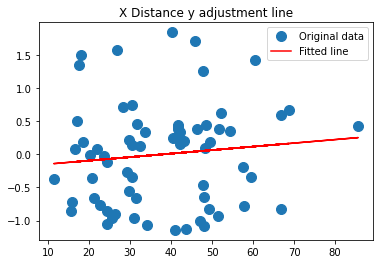

y = 0.0008532830789571362*x + -0.00035004238574766087


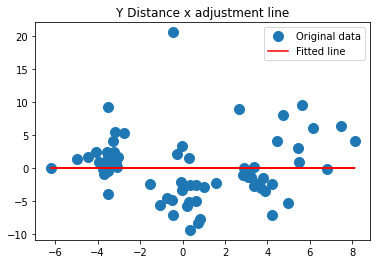

y = 2.301285470829721e-18*x + -7.887268700005141e-16


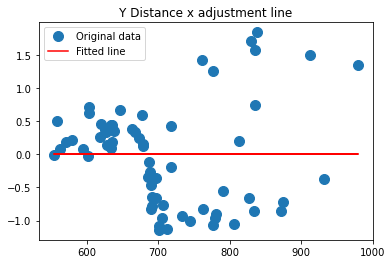

y = 0.013400838716471596*x + -0.5761181533313933


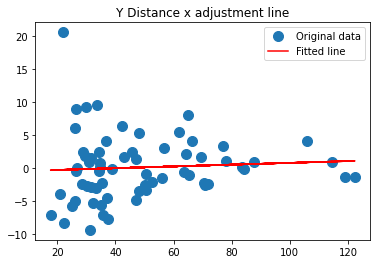

In [86]:
def newListRemove(index, inputList):
    nl = []
    for i in range(len(inputList)):
        if i != index:
            nl.append(inputList[i])
    return nl

# x distance y adjustment
x = np.array(xDistanceList)
y = np.array(absErY)
A = np.vstack([x, np.ones(len(x))]).T
m, c = np.linalg.lstsq(A, y, rcond=None)[0]
print(f"y = {m}*x + {c}")
plt.plot(x, y, 'o', label='Original data', markersize=10)
plt.plot(x, m*x + c, 'r', label='Fitted line')
plt.title("X Distance y adjustment line")
plt.legend()
plt.show()

# y distance x adjustment
x = np.array(yDistanceList)
y = np.array(absErX)
A = np.vstack([x, np.ones(len(x))]).T
m, c = np.linalg.lstsq(A, y, rcond=None)[0]
print(f"y = {m}*x + {c}")
plt.plot(x, y, 'o', label='Original data', markersize=10)
plt.plot(x, m*x + c, 'r', label='Fitted line')
plt.title("Y Distance x adjustment line")
plt.legend()
plt.show()

# Horizontal position adjustment
x = np.array(avgImX)
y = np.array(absErY)
A = np.vstack([x, np.ones(len(x))]).T
m, c = np.linalg.lstsq(A, y, rcond=None)[0]
print(f"y = {m}*x + {c}")
plt.plot(x, y, 'o', label='Original data', markersize=10)
plt.plot(x, m*x + c, 'r', label='Fitted line')
plt.title("Y Distance x adjustment line")
plt.legend()
plt.show()

# bbox width distance x distance adjustment
outliersRemovedX = newListRemove(54, widthList)
outliersRemovedY = newListRemove(54, absErX)
outliersRemovedX = newListRemove(54, outliersRemovedX)
outliersRemovedY = newListRemove(54, outliersRemovedY)

x = np.array(outliersRemovedX)
y = np.array(outliersRemovedY)
A = np.vstack([x, np.ones(len(x))]).T
m, c = np.linalg.lstsq(A, y, rcond=None)[0]
print(f"y = {m}*x + {c}")
plt.plot(x, y, 'o', label='Original data', markersize=10)
plt.plot(x, m*x + c, 'r', label='Fitted line')
plt.title("Y Distance x adjustment line")
plt.legend()
plt.show()

In [52]:
for i, val in enumerate(outliersRemovedX):
    print(f"{i} {outliersRemovedY[i]} : {outliersRemovedX[i]}")

0 4.202174816713864 : 83.48986816410002
1 12.898775417908674 : 64.8602294922
2 1.2082949140997243 : 34.5502319336
3 -0.056039238567574756 : 50.27026367190001
4 8.327763553473627 : 56.712097168000014
5 12.745385828383164 : 26.567871093800022
6 11.884862046014945 : 26.14245605459996
7 -2.368289553512824 : 17.663269043000014
8 -2.851604247334386 : 47.043029785099975
9 11.062070336279938 : 36.82122802729998
10 -3.9738786525340544 : 35.13989257809999
11 2.094409066052833 : 43.0405883789
12 0.024632803934569125 : 84.1580810547
13 4.4883197781721655 : 66.43927001949999
14 2.6660439508469196 : 28.933166503899997
15 -2.324049164485956 : 25.923339843699978
16 -0.19597733108704674 : 70.72674560550001
17 2.344717407088062 : 34.44506835940001
18 8.661267235501933 : 105.97802734369998
19 1.2562831722119192 : 87.66290283199999
20 3.234398535470401 : 63.744934081999986
21 3.9096251464207086 : 31.518005371100003
22 1.3806357324145608 : 33.39807128910002
23 4.25883663875684 : 64.22399902350003
24 6.0396

In [53]:
results

[{'imNumber': 1,
  'imShape': (720, 1280, 3),
  'bbox': {'top': 340.3418273926,
   'right': 868.1537475586,
   'bottom': 393.3275146484,
   'left': 784.6638793945},
  'provided': (21.30970213, 2.7243980956),
  'predicted': (17.107527313286138, 2.6963466574246997)},
 {'imNumber': 2,
  'imShape': (720, 1280, 3),
  'bbox': {'top': 333.6641235352,
   'right': 867.5598144531,
   'bottom': 377.7915344238,
   'left': 802.6995849609},
  'provided': (34.9200542691, 6.2870887236),
  'predicted': (22.021278851191326, 3.7397246558180886)},
 {'imNumber': 3,
  'imShape': (720, 1280, 3),
  'bbox': {'top': 340.1323547363,
   'right': 651.55859375,
   'bottom': 368.0708007812,
   'left': 617.0083618164},
  'provided': (42.5482547368, -2.7139237674),
  'predicted': (41.33995982270027, -4.605845909788054)},
 {'imNumber': 4,
  'imShape': (720, 1280, 3),
  'bbox': {'top': 344.2061767578,
   'right': 730.0484619141,
   'bottom': 385.2985839844,
   'left': 679.7781982422},
  'provided': (28.3564872865, -0.34